# Self-Driving Car Engineer Nanodegree


## Project: **Finding Lane Lines on the Road**

## Import Packages

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

## Read in an Image

This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)


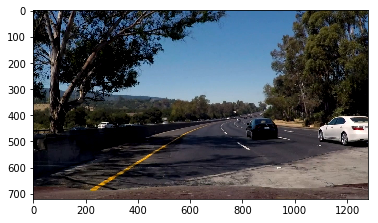

In [2]:
# For several sections we are going to use a very specific frame of the challenge video.
challenge_input = 'test_videos/challenge.mp4'
clip = VideoFileClip(challenge_input)
image = clip.get_frame(5.9)
print('This image is:', type(image), 'with dimensions:', image.shape)
plt.imshow(image)

## Color spaces

### [RGB](https://en.wikipedia.org/wiki/RGB_color_model)

This is the color space we are reading the image in.

### [HSV](https://en.wikipedia.org/wiki/HSL_and_HSV)

Is important to notice that during the RGB to HSV conversion process, some scaling happens ([more information](https://docs.opencv.org/2.4/modules/imgproc/doc/miscellaneous_transformations.html?#cvtcolor)). Therefore, the range of values we operate on are:
* H ∈ [0, 180]
* S ∈ [0, 255]
* V ∈ [0, 255]

Additionally, we used [this color picker](https://alloyui.com/examples/color-picker/hsv) to find the HSV values for some colors like white or yellow.

### [HSL](https://en.wikipedia.org/wiki/HSL_and_HSV)

Similarly to HSV, some scaling happens in the RGB to HSL conversion process. But another important detail is that opencv switches the order of saturation and lightness; so we are actually dealing with a HLS color space.

The range of values we operate on are:
* H ∈ [0, 180]
* L ∈ [0, 255]
* S ∈ [0, 255]

Additionally, we used [this color picker](https://www.w3schools.com/colors/colors_hsl.asp) to find the HSL values for some colors like white or yellow.

### Some useful transformation functions

In [3]:
from collections import namedtuple

def to_hsv(img: np.array) -> np.array:
    return cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

def to_hsl(img: np.array) -> np.array:
    return cv2.cvtColor(img, cv2.COLOR_RGB2HLS)

ColorBounds = namedtuple('ColorBounds', ['lower_bound', 'upper_bound'])

def get_mask(img: np.array, bounds: ColorBounds) -> np.array:
    """Returns the pixels within the specified bounds."""
    return cv2.inRange(img, bounds.lower_bound, bounds.upper_bound)

def apply_mask(img: np.array, mask: np.array):
    return cv2.bitwise_and(img, img, mask=mask)

## Detecting yellow pixels

In order to have more accurate results, let's extract the yellow pixels in a given image. However, we first need to decide in which color space are we going to operate on.

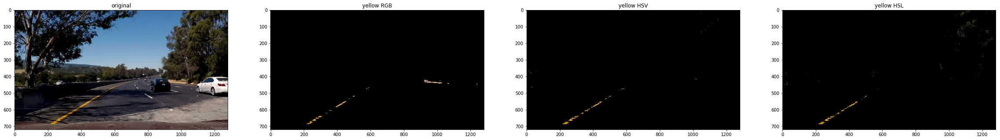

In [4]:
def get_yellow_rgb_mask(img: np.array) -> np.array:
    # The RGB range for the color yellow was calculated using an standard color picker.
    return get_mask(img, ColorBounds(np.uint8([180, 50, 0]), np.uint8([255, 255, 150])))

def get_yellow_hsv_mask(img: np.array) -> np.array:
    # From https://docs.opencv.org/3.2.0/df/d9d/tutorial_py_colorspaces.html
    # Yellow is detected as:
    # lower bound: [h - 10, 100, 100]
    # upper bound: [h + 10, 255, 255]
    # where:
    #  yellow_rgb = np.uint8([[[255, 255, 0]]])
    #  h = cv2.cvtColor(yellow_rgb, cv2.COLOR_RGB2HSV)[0][0][0]
    #  h == 30
    return get_mask(to_hsv(img), ColorBounds(np.uint8([20, 100, 100]), np.uint8([40, 255, 255])))

def get_yellow_hsl_mask(img: np.array) -> np.array:
    # We used https://www.w3schools.com/colors/colors_hsl.asp to find a decent bound for
    # detecting color yellow.
    return get_mask(to_hsl(img), ColorBounds(np.uint8([20, 30, 120]), np.uint8([35, 230, 255])))

fig = plt.figure(figsize=(40, 40))
subplot = fig.add_subplot(1, 4, 1)
subplot.title.set_text('original')
plt.imshow(image)

subplot = fig.add_subplot(1, 4, 2)
subplot.title.set_text('yellow RGB')
plt.imshow(apply_mask(image, get_yellow_rgb_mask(image)))

subplot = fig.add_subplot(1, 4, 3)
subplot.title.set_text('yellow HSV')
plt.imshow(apply_mask(image, get_yellow_hsv_mask(image)))

subplot = fig.add_subplot(1, 4, 4)
subplot.title.set_text('yellow HSL')
plt.imshow(apply_mask(image, get_yellow_hsl_mask(image)))

plt.show()

We can see that HSV and HSL are more effective at detecting yellow lines. Now, between HSV and HSL, HSV was much easier to tune. So we decided to stick with the **HSV** color space in order to detect yellow pixels.

## Detecting white pixels

Now, we need to go through a similar process in order to identify white pixels.

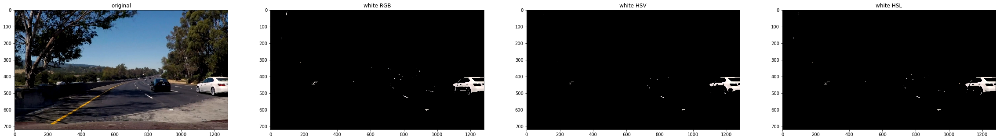

In [5]:
def get_white_rgb_mask(img: np.array) -> np.array:
    # The RGB range for the color white was calculated using an standard color picker.
    return get_mask(img, ColorBounds(np.uint8([180, 180, 180]), np.uint8([255, 255, 255])))

def get_white_hsv_mask(img: np.array) -> np.array:
    # We used https://alloyui.com/examples/color-picker/hsv to find a decent bound for
    # detecting color white.
    return get_mask(to_hsv(img), ColorBounds(np.uint8([0, 0, 220]), np.uint8([255, 35, 255])))

def get_white_hsl_mask(img: np.array) -> np.array:
    # We only care about high lightness in this case.
    return get_mask(to_hsl(img), ColorBounds(np.uint8([0, 200, 0]), np.uint8([180, 255, 255])))

fig = plt.figure(figsize=(40, 40))
subplot = fig.add_subplot(1, 4, 1)
subplot.title.set_text('original')
plt.imshow(image)

subplot = fig.add_subplot(1, 4, 2)
subplot.title.set_text('white RGB')
plt.imshow(apply_mask(image, get_white_rgb_mask(image)))

subplot = fig.add_subplot(1, 4, 3)
subplot.title.set_text('white HSV')
plt.imshow(apply_mask(image, get_white_hsv_mask(image)))

subplot = fig.add_subplot(1, 4, 4)
subplot.title.set_text('white HSL')
plt.imshow(apply_mask(image, get_white_hsl_mask(image)))

plt.show()

We can see that RGB and HSL are more effective at detecting white lines. However, HSL was much easier to tune due to the fact that we only care about pixels with high lightness, so we decided to stick with **HSL** for white lines detection.

## Combine yellow pixels and white pixels detection

The next step of our pipeline is to combine the mask generated by the yellow pixel detection and white pixel detection into one mask.

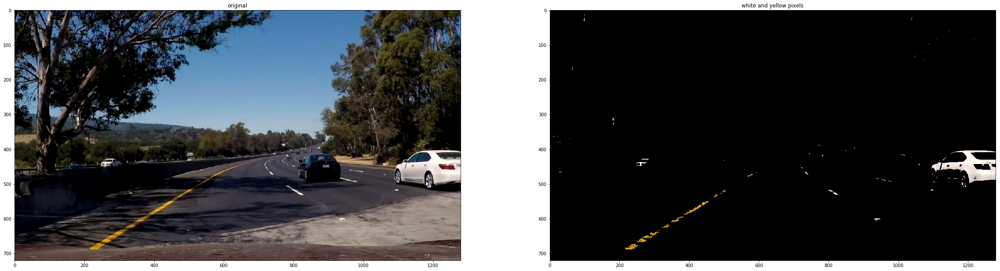

In [6]:
def get_white_and_yellow_mask(img: np.array) -> np.array:
    white_mask = get_white_hsl_mask(img)
    yellow_mask = get_yellow_hsv_mask(img)
    return cv2.bitwise_or(white_mask, yellow_mask)

fig = plt.figure(figsize=(40, 40))
subplot = fig.add_subplot(1, 2, 1)
subplot.title.set_text('original')
plt.imshow(image)

subplot = fig.add_subplot(1, 2, 2)
subplot.title.set_text('white and yellow pixels')
white_and_yellow_image = apply_mask(image, get_white_and_yellow_mask(image))
plt.imshow(white_and_yellow_image)

plt.show()

## Canny edge detection

[Canny edge detection](https://en.wikipedia.org/wiki/Canny_edge_detector) will allow us to find interesting edges in our image. However, in order to run the canny edge detection algorithm we first need to convert the image into gray scale, so we can compute the gradient easily. The second thing we need to do, is to apply a Gassian blur on the image in order to smooth edges.

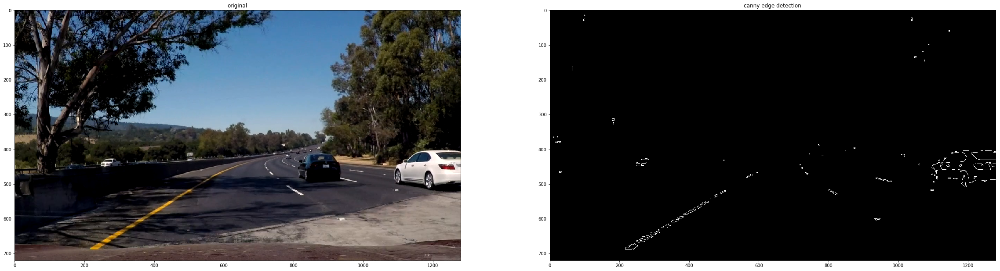

In [7]:
def grayscale(img: np.array) -> np.array:
    """Applies the Grayscale transform.

    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    # Or use BGR2GRAY if you read an image with cv2.imread()
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

def gaussian_blur(img: np.array, kernel_size: int=5) -> np.array:
    """Applies a Gaussian Noise kernel."""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def canny(img: np.array, low_threshold: int=50, high_threshold: int=150) -> np.array:
    """Applies the Canny transform."""
    return cv2.Canny(img, low_threshold, high_threshold)

fig = plt.figure(figsize=(40, 40))
subplot = fig.add_subplot(1, 2, 1)
subplot.title.set_text('original')
plt.imshow(image)

subplot = fig.add_subplot(1, 2, 2)
subplot.title.set_text('canny edge detection')
canny_image = canny(gaussian_blur(grayscale(white_and_yellow_image)))
plt.imshow(canny_image, cmap='gray')

plt.show()

## Area of interest

The Canny edge detection algorithm has successfully identified the edges we are interested at and some others like the white vehicle on the right. Now, the next step is to remove those edges we are not interested at selecting a region of interest.

Our region of interest is going to consist of the following isosceles trapezoid:

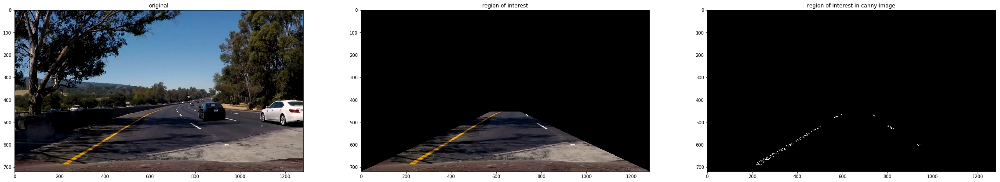

In [8]:
def get_vertices(shape: np.array) -> np.array:
    return np.int32([[
        (0, shape[0]),  # Bottom left corner
        (shape[1] * 0.45, shape[0] * 0.63),  # Top left corner
        (shape[1] * 0.55, shape[0] * 0.63),  # Top right corner
        (shape[1], shape[0])]])  # Bottom right corner

def region_of_interest(img: np.array, vertices: np.array) -> np.array:
    """
    Applies an image mask.

    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    # Defining a blank mask to start with.
    mask = np.zeros_like(img)

    ignore_mask_color = 0b11111111  # 255 or white
    if len(img.shape) > 2:
        # For colored images we have a third shape element that corresponds
        # to the number of channels.
        channel_count = img.shape[2]
        ignore_mask_color = (ignore_mask_color,) * channel_count

    # Fill everything inside the given polygon with `ignore_mask_color`.
    cv2.fillPoly(mask, vertices, ignore_mask_color)

    # Pixels where mask doesn't contain a zero value.
    return cv2.bitwise_and(img, mask)

fig = plt.figure(figsize=(40, 40))
subplot = fig.add_subplot(1, 3, 1)
subplot.title.set_text('original')
plt.imshow(image)

subplot = fig.add_subplot(1, 3, 2)
subplot.title.set_text('region of interest')
region_image = region_of_interest(image, get_vertices(image.shape))
plt.imshow(region_image, cmap='gray')

subplot = fig.add_subplot(1, 3, 3)
subplot.title.set_text('region of interest in canny image')
canny_region_image = region_of_interest(canny_image, get_vertices(canny_image.shape))
plt.imshow(canny_region_image, cmap='gray')

plt.show()

## Hough lines

The [Hough lines algorithm](https://docs.opencv.org/2.4/doc/tutorials/imgproc/imgtrans/hough_lines/hough_lines.html) is used to identify straight lines in an image. Therefore, this algorithm is suitable for getting the lines that identify the lanes in a canny image.

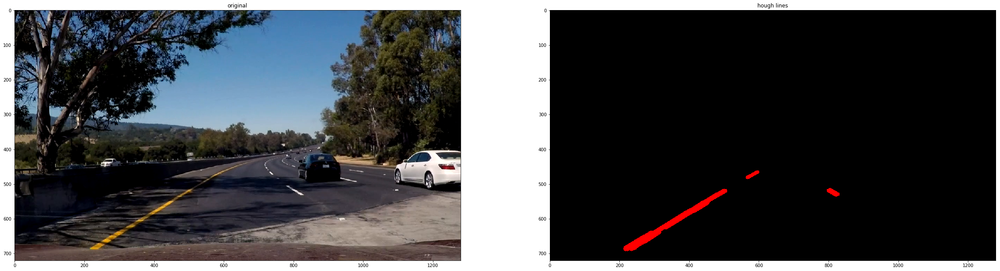

In [9]:
from typing import Callable, List, Optional

def draw_lines(img: np.array, lines: np.array, color: List=[255, 0, 0], thickness: int=10):
    """
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    for line in lines:
        for x1, y1, x2, y2 in line:
            cv2.line(img, (x1, y1), (x2, y2), color, thickness)

def hough_lines(img: np.array,
                process_lines: Optional[Callable[[np.array], np.array]]=None,
                rho: int=1,
                theta: float=np.pi / 180,
                threshold: int=15,
                min_line_len: int=20,
                max_line_gap: int=15):
    """
    `img` should be the output of a Canny transform.

    Returns an image with hough lines drawn.
    """
    hough_lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    if process_lines:
        hough_lines = process_lines(hough_lines, img.shape)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, hough_lines)
    return line_img

def weighted_img(img, initial_img, α=0.8, β=1., γ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, γ)

fig = plt.figure(figsize=(40, 40))
subplot = fig.add_subplot(1, 2, 1)
subplot.title.set_text('original')
plt.imshow(image)

subplot = fig.add_subplot(1, 2, 2)
subplot.title.set_text('hough lines')
hough_image = hough_lines(canny_region_image)
plt.imshow(hough_image, cmap='gray')

plt.show()

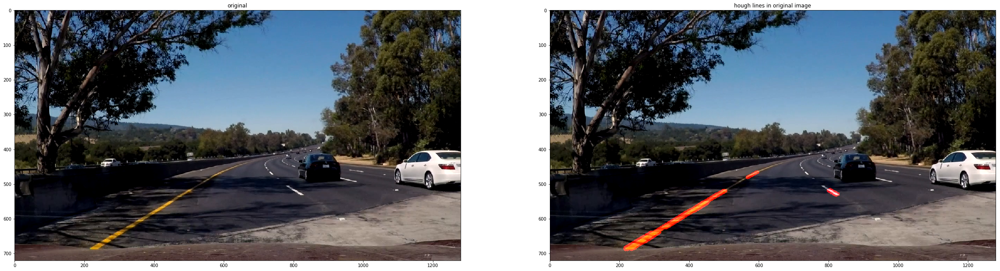

In [10]:
def process_image(img: np.array, process_lines: Optional[Callable[[np.array, np.array], np.array]]=None) -> np.array:
    """Returns a processed image with some hough lines drawn on it."""
    white_and_yellow_image = apply_mask(img, get_white_and_yellow_mask(img))
    canny_image = canny(gaussian_blur(grayscale(white_and_yellow_image)))
    region_image = region_of_interest(canny_image, get_vertices(canny_image.shape))
    hough_image = hough_lines(region_image, process_lines=process_lines)
    return weighted_img(img, hough_image)

fig = plt.figure(figsize=(40, 40))
subplot = fig.add_subplot(1, 2, 1)
subplot.title.set_text('original')
plt.imshow(image)

subplot = fig.add_subplot(1, 2, 2)
subplot.title.set_text('hough lines in original image')
hough_image = process_image(image)
plt.imshow(hough_image)

plt.show()

## Merging Hough lines

As you may have noticed, our transformed image contains multiple Hough lines. For the purpose of this project, we need to draw exactly one line for the left lane and exactly one line for the right line.

Before getting into merging Hough lines, let's separate lines into two sets: one for the lines that belong to the left line, and some other lines for the right line. An easy way of accomplishing that is to separate lines by their slope: lines with a positive slope belong to the left line, and lines with a negative slope belong to the right side. However, we are going to exclude some lines if they have an infinite slope (vertical lines) or if they have a very small slope (horizontal lines).

After separating lines, we can run a linear regression model on each set of lines in order to find a representative for each set. That's the only line we are going to draw (one for each side).

Finally, we need to extend the segment from the bottom of the image all the way to the top of the region of interest.

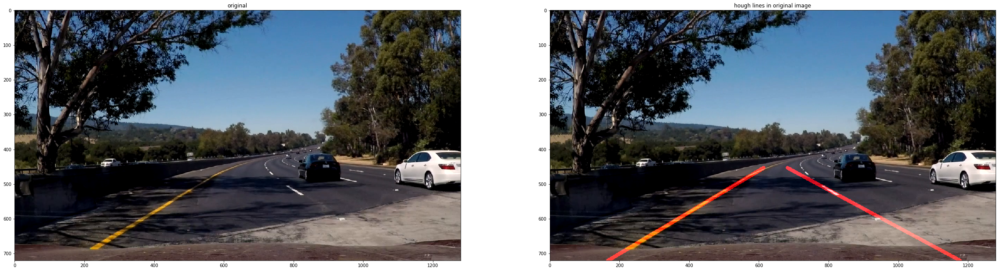

In [17]:
from typing import Tuple

def calculate_slope(line: np.array) -> float:
    """Calculate the slope of a single line."""
    for x1, y1, x2, y2 in line:
        slope = np.inf
        if x1 != x2:
            slope = (y2 - y1) / float(x2 - x1)
        return slope

def calculate_slopes(lines: np.array) -> List:
    """
    Calculates the slope for each specified line.

    For lines with infinite slope we return np.inf.
    """
    lines_with_slopes = []
    for line in lines:
        lines_with_slopes.append((calculate_slope(line), line))
    return lines_with_slopes

def include_line(line: np.array, vertices: np.array, slope: float, epsilon: float=1e-2) -> bool:
    """Whether the line should be included or not considering its slope and coordinates."""
    if np.isinf(slope): return False
    if abs(slope) < epsilon: return False

    (bottom_left, top_left, top_right, bottom_right) = vertices
    (x1, y1, x2, y2) = line[0]
    # Discard noisy lines.
    if slope > 0 and (x1 < top_right[0] or x2 < top_right[0]): return False
    if slope < 0 and (x1 > top_left[0] or x2 > top_left[0]): return False

    return True

def divide_lines_by_slopes(lines: np.array, vertices: np.array) -> Tuple:
    """
    Categorizes lines by slope.

    We split a list of lines split into two categories:
    The first element corresponds to the lines with positive slope,
    and the second selement corresponds to lines with negative slope.
    """
    lines_with_slopes = calculate_slopes(lines)
    positive_lines = []
    negative_lines = []
    for slope, line in lines_with_slopes:
        if not include_line(line, vertices, slope): continue

        # Lines with a positive slope correspond to the line on the right.
        if slope > 0:
            positive_lines.append(line)
        else:
            negative_lines.append(line)

    return (positive_lines, negative_lines)

def extend_line(m: float, b: float, vertices: np.array) -> np.array:
    """Extends a line from the bottom of the image to the top of the region of interest."""
    (bottom_left, top_left, top_right, bottom_right) = vertices
    if m > 0:
        # For lines on the right side, we want to extend from the top right of the region of interest
        # to the bottom right.
        y1 = top_right[1]
        x1 = int((y1 - b) / m)
        y2 = bottom_right[1]
        x2 = int((y2 - b) / m)
        return np.array([[x1, y1, x2, y2]])

    # For lines on the left side, we want to extend from the bottom left corner, to the top left of
    # the region of interest.
    y1 = bottom_left[1]
    x1 = int((y1 - b) / m)
    y2 = top_left[1]
    x2 = int((y2 - b) / m)
    return np.array([[x1, y1, x2, y2]])

def average_lines(list_of_lines: np.array, vertices: np.array) -> np.array:
    """Computes the average for every set of lines."""

    averaged_lines = []
    for lines in list_of_lines:
        if not lines: continue

        # Perform linear regression on a set of lines to identify the "best line".
        # Extracted from: https://docs.scipy.org/doc/numpy/reference/generated/numpy.linalg.lstsq.html
        xs = []
        ys = []
        for line in lines:
            for x1, y1, x2, y2 in line:
                xs.append(x1)
                xs.append(x2)
                ys.append(y1)
                ys.append(y2)
        
        xs = np.array(xs)
        ys = np.array(ys)
        A = np.vstack([xs, np.ones(len(xs))]).T
        m, b = np.linalg.lstsq(A, ys, rcond=-1)[0]
        averaged_lines.append(extend_line(m, b, vertices))

    return np.array(averaged_lines)

def process_lines(lines: np.array, shape: np.array) -> np.array:
    vertices = get_vertices(shape)[0]
    return average_lines(divide_lines_by_slopes(lines, vertices), vertices)

fig = plt.figure(figsize=(40, 40))
subplot = fig.add_subplot(1, 2, 1)
subplot.title.set_text('original')
plt.imshow(image)

subplot = fig.add_subplot(1, 2, 2)
subplot.title.set_text('hough lines in original image')
hough_image = process_image(image, process_lines=process_lines)
plt.imshow(hough_image)

plt.show()

## Running the pipeline

### Test images

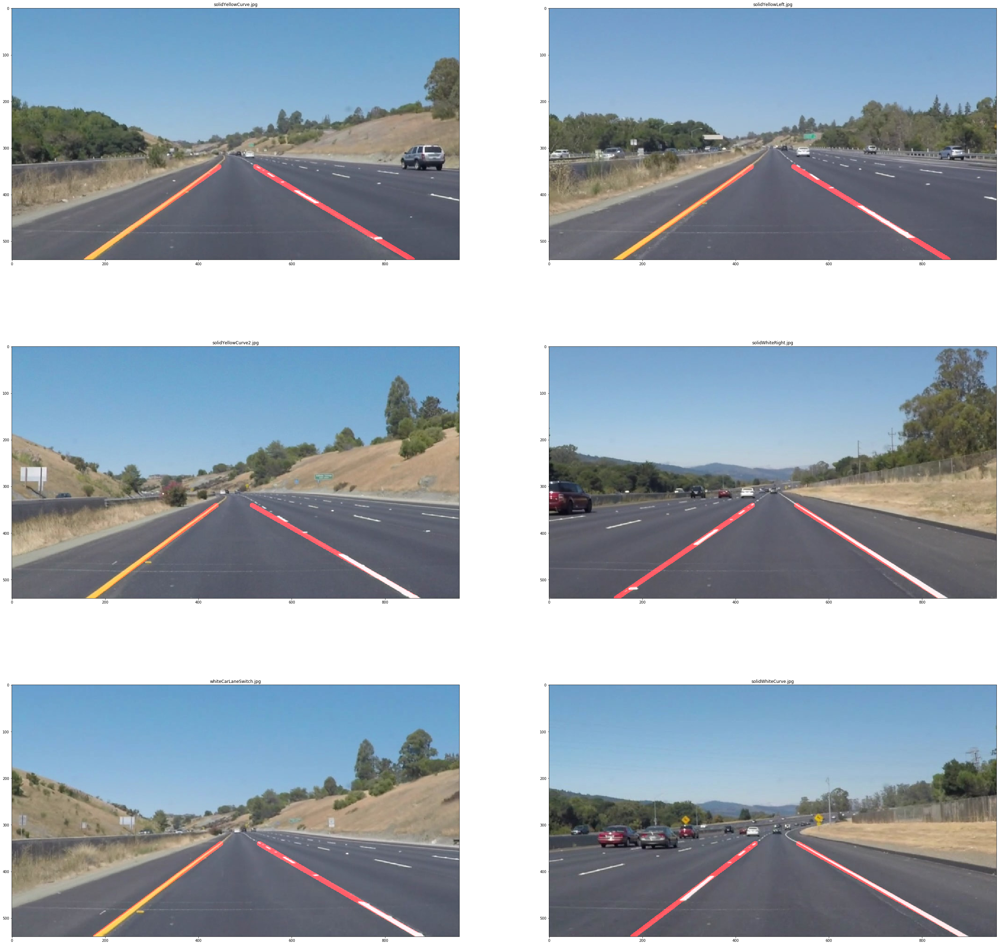

In [18]:
import math
import os

def test_on_images(input_dir: str, output_dir: str, cols: int=2) -> None:
    image_filenames = os.listdir(input_dir)
    fig = plt.figure(figsize=(50, 50))
    rows = int(math.ceil(len(image_filenames) / cols))
    for i, image_filename in enumerate(image_filenames):
        image = mpimg.imread(os.path.join(input_dir, image_filename))
        image_with_lanes = process_image(image, process_lines=process_lines)
        output_filename = os.path.join(output_dir, image_filename)
        mpimg.imsave(output_filename, image_with_lanes)

        subplot = fig.add_subplot(rows, cols, i + 1)
        subplot.title.set_text(image_filename)
        plt.imshow(image_with_lanes)
    plt.show()

test_on_images('test_images', 'test_images_output')

### Test videos

In [19]:
def process_image(img: np.array, process_lines: Optional[Callable[[np.array], np.array]]=process_lines) -> np.array:
    white_and_yellow_image = apply_mask(img, get_white_and_yellow_mask(img))
    canny_image = canny(gaussian_blur(grayscale(white_and_yellow_image)))
    region_image = region_of_interest(canny_image, get_vertices(canny_image.shape))
    hough_image = hough_lines(region_image, process_lines=process_lines)
    return weighted_img(img, hough_image)

def process_video(challenge_input: str, challenge_output: str, process_image: Callable[[np.array], np.array]) -> None:
    clip = VideoFileClip(challenge_input)
    challenge_clip = clip.fl_image(process_image)
    %time challenge_clip.write_videofile(challenge_output, audio=False)

    return HTML("""
    <video width="960" height="540" controls>
      <source src="{0}">
    </video>
    """.format(challenge_output))

In [20]:
process_video('test_videos/solidWhiteRight.mp4', 'test_videos_output/solidWhiteRight.mp4', process_image)

[MoviePy] >>>> Building video test_videos_output/solidWhiteRight.mp4
[MoviePy] Writing video test_videos_output/solidWhiteRight.mp4


100%|█████████▉| 221/222 [00:04<00:00, 50.74it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/solidWhiteRight.mp4 

CPU times: user 3.55 s, sys: 196 ms, total: 3.74 s
Wall time: 4.91 s


In [21]:
process_video('test_videos/solidYellowLeft.mp4', 'test_videos_output/solidYellowLeft.mp4', process_image)

[MoviePy] >>>> Building video test_videos_output/solidYellowLeft.mp4
[MoviePy] Writing video test_videos_output/solidYellowLeft.mp4


100%|█████████▉| 681/682 [00:14<00:00, 45.74it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/solidYellowLeft.mp4 

CPU times: user 11.5 s, sys: 590 ms, total: 12 s
Wall time: 15.6 s


In [ ]:
process_video('test_videos/challenge.mp4', 'test_videos_output/challenge.mp4', process_image)

[MoviePy] >>>> Building video test_videos_output/challenge.mp4
[MoviePy] Writing video test_videos_output/challenge.mp4


 43%|████▎     | 109/251 [00:04<00:06, 21.81it/s]

## Writeup and Submission

If you're satisfied with your video outputs, it's time to make the report writeup in a pdf or markdown file. Once you have this Ipython notebook ready along with the writeup, it's time to submit for review! Here is a [link](https://github.com/udacity/CarND-LaneLines-P1/blob/master/writeup_template.md) to the writeup template file.
